First, let's make sure your GPU is enabled by entering the following command.

In [ ]:
!nvidia-smi

Fri Sep 29 13:25:26 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Then, let's install FastSAM, CLIP and other dependencies.

In [ ]:
# To make it easier to manage images and models we create a HOME constant.
import os
HOME = os.getcwd()
%cd {HOME}

# install FastSAM
!git clone https://github.com/CASIA-IVA-Lab/FastSAM.git
!pip -q install -r FastSAM/requirements.txt
# install CLIP
!pip -q install git+https://github.com/openai/CLIP.git

/content
fatal: destination path 'FastSAM' already exists and is not an empty directory.
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.7/43.7 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.0/41.0 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.0/41.0 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.5/87.5 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.5/84.5 kB 1.9 MB/s 

Then, we need to download the FastSAM's weights:

In [ ]:
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://huggingface.co/spaces/An-619/FastSAM/resolve/main/weights/FastSAM.pt
!ls -lh {HOME}/weights

total 139M
-rw-r--r-- 1 root root 139M Jun 20 07:01 FastSAM.pt


In [ ]:
FAST_SAM_CHECKPOINT_PATH = f"{HOME}/weights/FastSAM.pt"

# Import Libraries

In [ ]:
%cd {HOME}/FastSAM

import os
import cv2
import torch
import base64
import time
from PIL import Image
from IPython.display import Image as IPImage
from IPython.display import Video

import numpy as np

from fastsam import FastSAM, FastSAMPrompt

#Import this as well if you're using google colab:
#If not, replace all cv2_imshow(img) with cv2.imshow('img', img)
from google.colab.patches import cv2_imshow

/content/FastSAM


# Load FastSAM Model

In [ ]:
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

fast_sam = FastSAM(FAST_SAM_CHECKPOINT_PATH)

In [ ]:
FAST_SAM_CHECKPOINT_PATH = f"{HOME}/weights/FastSAM.pt"

## MRI Image Example of a FastSAM Segmentation

Let's first try with an image of a MRI:

In [ ]:
IMAGE_PATH = f"{HOME}/data/brain_mri.jpg"

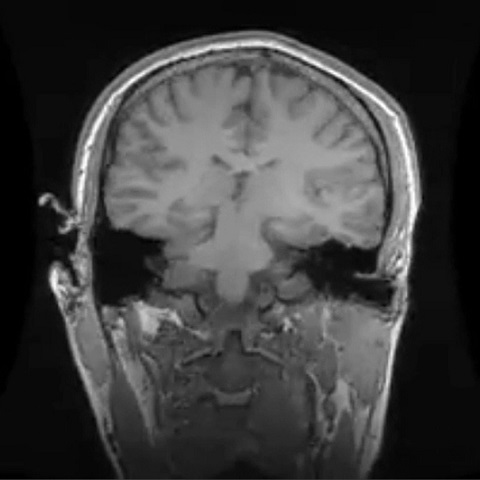

In [ ]:
image = cv2.imread(IMAGE_PATH)
cv2_imshow(image)

As you can notice, the image has rather poor quality so this might be a challenge for FastSAM. Let's hope that it will be able to segment the different parts of the head correctly and fast, so that we can use it in a real-time context.

Here is a small description of all the arguments used in `fast_sam`:

* `retina_masks=True` determines whether the model uses retina masks for generating segmentation masks.
* `imgsz=480` sets the input image size to 480x480 pixels for processing by the model.
* `conf=0.008` sets the minimum confidence threshold for object detection.
* `iou=0.6` sets the minimum intersection over union threshold for non-maximum suppression to filter out duplicate detections.

For your own images, try to play with `conf` and `iou` values to segment it correctly.

In [ ]:
results = fast_sam(
    source=IMAGE_PATH,
    device=DEVICE,
    retina_masks=True,
    imgsz=480,
    conf=0.1,
    iou=0.5)
prompt_process = FastSAMPrompt(IMAGE_PATH, results, device=DEVICE)
masks = prompt_process.everything_prompt()
prompt_process.plot(annotations=masks, output_path=f"{HOME}/masked_MRI_image.jpg")


image 1/1 /content/data/brain_mri.jpg: 480x480 4 objects, 62.8ms
Speed: 1.3ms preprocess, 62.8ms inference, 52.7ms postprocess per image at shape (1, 3, 480, 480)


The inference + postprocessing time is about 120 ms, so we can achieve about 8 frames per second. A MRI scan usually has 2 frames per second so we can use FastSAM to segment images on real-time! Let's see first see if it has segmented different parts of the head correctly.

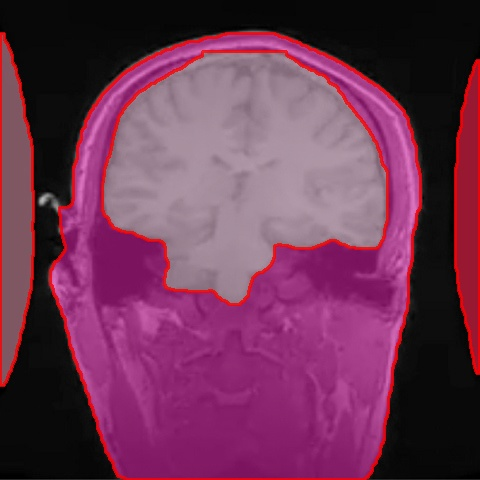

In [ ]:
img = cv2.imread(f"{HOME}/masked_MRI_image.jpg")
cv2_imshow(img)

FastSAM seems to have done a pretty good job capturing the brain. However, it also captures some regions which are not part of the brain.

---



# Real-Time MRI Scan Example for FastSAM segmentation:

Let's now test FastSAM for real-time applications such as a real-time MRI scan. Of course, I don't have access to live MRI scans but we can use a video of a MRI scan to emulate a real-time experience.

The video I used is a brain MRI scan which is lectured 10 times faster than the original MRI (otherwise it would have been too long to watch). You can see the video below.

In [ ]:
VIDEO_PATH = f"{HOME}/data/mri_scan_video.mp4"
Video(VIDEO_PATH, embed = True)

To use this video, let's first decompose it in .jpeg images.

In [ ]:
# Output directory for JPEG images
output_directory = f"{HOME}/data/video_into_images"

# Ensure that the output directory exists
os.makedirs(output_directory, exist_ok=True)

# Open the video file
cap = cv2.VideoCapture(VIDEO_PATH)

# Get the resolution of the video
frame_width = int(cap.get(3))  # Width
frame_height = int(cap.get(4))  # Height

# Check if the video was opened successfully
if not cap.isOpened():
    print("Unable to open the video. Check the file path.")
else:
    frame_count = 0

    while True:
        ret, frame = cap.read()

        # Check if reading the frame was successful
        if not ret:
            break

          # Save the frame as a JPEG image
        frame_filename = os.path.join(output_directory, f'frame_{frame_count:04d}.jpg')
        cv2.imwrite(frame_filename, frame)
        frame_count += 1

    # Release the video file
    cap.release()

    print(f'{frame_count} images of resolution 540x540 have been extracted and saved in {output_directory}')

317 images of resolution 540x540 have been extracted and saved in /content/data/video_into_images


Now that we have decomposed the video into images, we can run the model for each image.

In [ ]:

video_start_time = time.time()
image_times = []

for i in range(frame_count):
  FRAME_PATH = f"{HOME}/data/video_into_images/frame_{i:04d}.jpg"
  results = fast_sam(
    source=FRAME_PATH,
    device=DEVICE,
    retina_masks=True,
    imgsz=544, #must be multiple of max stride 32
    conf=0.04,
    iou=0.6)

  image_start_time = time.time()
  prompt_process = FastSAMPrompt(FRAME_PATH, results, device=DEVICE)
  masks = prompt_process.everything_prompt()
  prompt_process.plot(annotations=masks, output_path=f"{HOME}//data/video_into_images/mask_frame_{i:04d}.jpg")
  image_end_time = time.time()

  image_times.append(image_end_time-image_start_time)

video_end_time = time.time()

video_elapsed_time = video_end_time - video_start_time

# Affichez le temps écoulé en secondes
print(f"Elapsed time for segmenting the video: {video_elapsed_time:.2f}s")
print(f"Average time per image: {np.mean(np.array(image_times))}s")







image 1/1 /content/data/video_into_images/frame_0000.jpg: 544x544 8 objects, 102.6ms
Speed: 2.5ms preprocess, 102.6ms inference, 4.1ms postprocess per image at shape (1, 3, 544, 544)

image 1/1 /content/data/video_into_images/frame_0001.jpg: 544x544 7 objects, 59.1ms
Speed: 2.7ms preprocess, 59.1ms inference, 4.7ms postprocess per image at shape (1, 3, 544, 544)

image 1/1 /content/data/video_into_images/frame_0002.jpg: 544x544 8 objects, 59.3ms
Speed: 2.0ms preprocess, 59.3ms inference, 2.9ms postprocess per image at shape (1, 3, 544, 544)

image 1/1 /content/data/video_into_images/frame_0003.jpg: 544x544 10 objects, 62.1ms
Speed: 2.0ms preprocess, 62.1ms inference, 3.0ms postprocess per image at shape (1, 3, 544, 544)

image 1/1 /content/data/video_into_images/frame_0004.jpg: 544x544 9 objects, 59.3ms
Speed: 3.1ms preprocess, 59.3ms inference, 3.1ms postprocess per image at shape (1, 3, 544, 544)

image 1/1 /content/data/video_into_images/frame_0005.jpg: 544x544 7 objects, 60.7ms
Sp

Elapsed time for segmenting the video: 132.07s
Average time per image: 0.27625995103493095s


The time per image is a little longer than before, but we're still above the 2 frames per second limit.

Now let's use the masked images to create a new video.

In [ ]:
# Specify the resolution (width x height) of the video
resolution = (540, 540)  # Modify as needed

# Output path for the MP4 video
OUTPUT_VIDEO_PATH = f"{HOME}/masked_MRI_brain_video.mp4"

# Create a VideoWriter object to write the video
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Video codec for MP4
fps = 30.0  # Frames per second
out = cv2.VideoWriter(OUTPUT_VIDEO_PATH, fourcc, fps, resolution)

# Iterate through the images and add them to the video
for i in range(frame_count):
    frame = cv2.imread(f"{HOME}/data/video_into_images/mask_frame_{i:04d}.jpg")
    out.write(frame)

# Release the video
out.release()

print(f'The MP4 video has been successfully created and saved as {OUTPUT_VIDEO_PATH}')

The MP4 video has been successfully created and saved as /content/masked_MRI_brain_video.mp4


Let's see the result!

In [ ]:
Video(OUTPUT_VIDEO_PATH, embed = True)

Great ! FastSAM has obviously its limitations, and you might get better results by tweaking more its parameters and preprocessing the image.

Furthermore, FastSAM has also other segmentation methods which might be interesting for biomedical imaging, such as segmentation by point or by region of interest. Feel free to use this notebook as a starting point for your own projects!